In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('data/boston_crime.csv')

/var/folders/vz/rdt2gv7d2mqft7p3lsdk5hz40000gn/T/ipykernel_1810/1591175307.py:1: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('data/boston_crime.csv')


In [3]:
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I152071100,2611,Other,ABDUCTION - INTICING,D4,151,NaN,2015-08-25 14:00:00,2015,8,Tuesday,14,Part Two,BERKELEY ST,42.346465,-71.070704,"(42.34646505, -71.07070436)"
1,I152054466,2611,Other,ABDUCTION - INTICING,B2,319,NaN,2015-07-01 20:30:00,2015,7,Wednesday,20,Part Two,NAZING ST,42.306641,-71.085850,"(42.30664081, -71.08584976)"
2,I162018570,2611,Other,ABDUCTION - INTICING,D4,,NaN,2016-03-09 17:28:00,2016,3,Wednesday,17,Part Two,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
3,I192018747,2611,Other,ABDUCTION - INTICING,B2,179,NaN,2019-03-13 19:34:00,2019,3,Wednesday,19,Part Two,NaN,NaN,NaN,"(0.00000000, 0.00000000)"
4,I162001276,2611,Other,ABDUCTION - INTICING,B3,428,NaN,2016-01-05 16:12:00,2016,1,Tuesday,16,Part Two,NORFOLK ST,42.280566,-71.088017,"(42.28056608, -71.08801662)"


In [4]:
df.describe()

,OFFENSE_CODE,YEAR,MONTH,HOUR,Lat,Long
count,525575.000000,525575.000000,525575.000000,525575.000000,495821.000000,495821.000000
mean,2332.260663,2017.591973,6.694575,13.073356,42.240681,-70.952056
std,1182.734163,1.566007,3.313055,6.350834,1.872682,3.029333
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.203312
25%,1102.000000,2016.000000,4.000000,9.000000,42.296852,-71.097466
50%,3005.000000,2018.000000,7.000000,14.000000,42.325024,-71.077734
75%,3201.000000,2019.000000,9.000000,18.000000,42.348288,-71.062535
max,3831.000000,2020.000000,12.000000,23.000000,42.395042,0.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525575 entries, 0 to 525574
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      525575 non-null  object 
 1   OFFENSE_CODE         525575 non-null  int64  
 2   OFFENSE_CODE_GROUP   426839 non-null  object 
 3   OFFENSE_DESCRIPTION  525575 non-null  object 
 4   DISTRICT             523113 non-null  object 
 5   REPORTING_AREA       525575 non-null  object 
 6   SHOOTING             100482 non-null  object 
 7   OCCURRED_ON_DATE     525575 non-null  object 
 8   YEAR                 525575 non-null  int64  
 9   MONTH                525575 non-null  int64  
 10  DAY_OF_WEEK          525575 non-null  object 
 11  HOUR                 525575 non-null  int64  
 12  UCR_PART             426729 non-null  object 
 13  STREET               504386 non-null  object 
 14  Lat                  495821 non-null  float64
 15  Long             

In [6]:
df.isnull().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP      98736
OFFENSE_DESCRIPTION         0
DISTRICT                 2462
REPORTING_AREA              0
SHOOTING               425093
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                98846
STREET                  21189
Lat                     29754
Long                    29754
Location                    0
dtype: int64

In [24]:
from matplotlib import pyplot as plt
grouped_df = df.groupby(['YEAR','OFFENSE_CODE_GROUP']).agg({'OFFENSE_CODE':'count'}).reset_index()
grouped_df.head()

,YEAR,OFFENSE_CODE_GROUP,OFFENSE_CODE
0,2015,Aggravated Assault,1415
1,2015,Aircraft,4
2,2015,Arson,11
3,2015,Assembly or Gathering Violations,240
4,2015,Auto Theft,988


Text(0.5, 1.0, 'Top 10 offense groups')

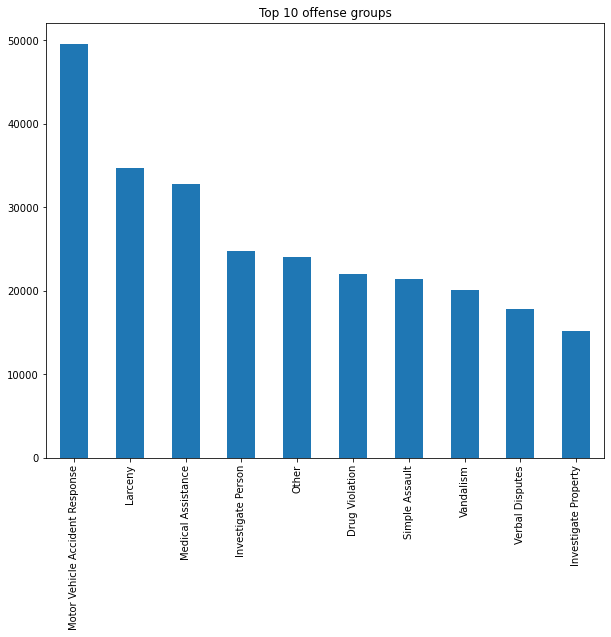

In [8]:
top_10 = df['OFFENSE_CODE_GROUP'].value_counts()[:10]
top_10.plot(kind='bar',figsize=(10,8))
plt.title('Top 10 offense groups')

In [18]:
grouped_df2 = df.groupby(['YEAR']).agg({'OFFENSE_CODE':'count'}).reset_index()
grouped_df2.head()

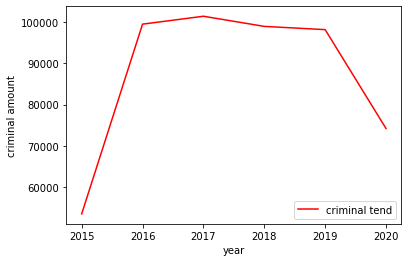

In [25]:
plt.plot(grouped_df2['YEAR'], grouped_df2['OFFENSE_CODE'],color = 'r',label="criminal tend")
plt.xlabel("year")
plt.ylabel("criminal amount")
plt.legend(loc = "best")
plt.show()

In [118]:
gp1 = grouped_df[grouped_df['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response']
gp2 = grouped_df[grouped_df['OFFENSE_CODE_GROUP'] == 'Larceny']
gp3 = grouped_df[grouped_df['OFFENSE_CODE_GROUP'] == 'Medical Assistance']
gp4 = grouped_df[grouped_df['OFFENSE_CODE_GROUP'] == 'Investigate Person']

In [119]:
def add_df(df1, df2, time_unit):
        df3 = df1.drop(columns='OFFENSE_CODE_GROUP').set_index(time_unit).add(df2.drop(columns='OFFENSE_CODE_GROUP').set_index(time_unit))
        return df3.reset_index()

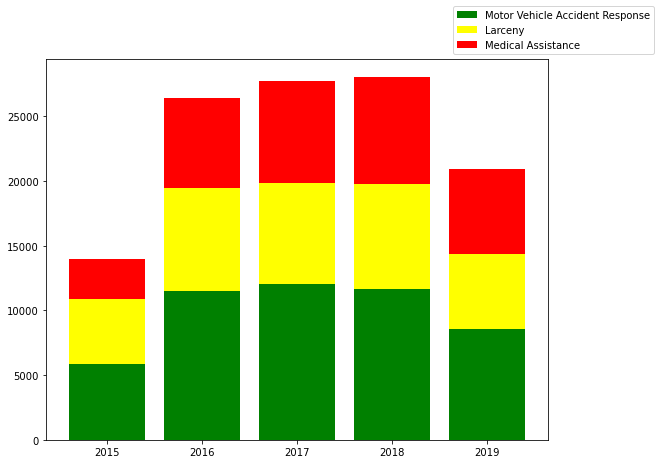

In [120]:
plt.figure(figsize=(9,7))
plt.bar(gp1['YEAR'],gp1['OFFENSE_CODE'],color="green",label="Motor Vehicle Accident Response")
plt.bar(gp2['YEAR'],gp2['OFFENSE_CODE'],color="yellow",bottom=gp1['OFFENSE_CODE'],label="Larceny")
plt.bar(gp3['YEAR'],gp3['OFFENSE_CODE'],color="red",bottom=add_df(gp1, gp2, 'YEAR')['OFFENSE_CODE'],label="Medical Assistance")

plt.legend(loc="lower left",bbox_to_anchor=(0.8,1.0))
plt.show()

In [121]:
grouped_month = df.groupby(['MONTH']).agg({'OFFENSE_CODE':'count'}).reset_index()

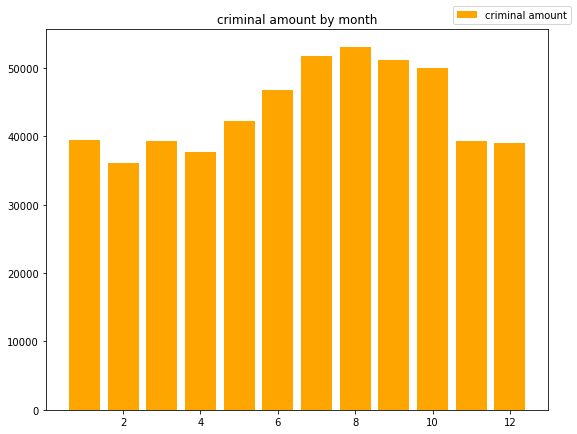

In [122]:
plt.figure(figsize=(9,7))
plt.bar(grouped_month['MONTH'],grouped_month['OFFENSE_CODE'],color="orange",label="criminal amount")
plt.title('criminal amount by month')

plt.legend(loc="lower left",bbox_to_anchor=(0.8,1.0))
plt.show()

In [123]:
grouped_day = df.groupby(['DAY_OF_WEEK','OFFENSE_CODE_GROUP']).agg({'OFFENSE_CODE':'count'}).reset_index()
gp1 = grouped_day[grouped_day['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response']
gp2 = grouped_day[grouped_day['OFFENSE_CODE_GROUP'] == 'Larceny']
gp3 = grouped_day[grouped_day['OFFENSE_CODE_GROUP'] == 'Medical Assistance']

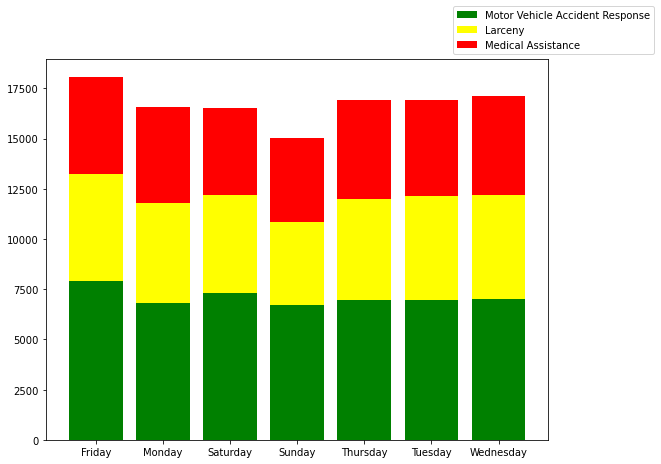

In [124]:
plt.figure(figsize=(9,7))
plt.bar(gp1['DAY_OF_WEEK'],gp1['OFFENSE_CODE'],color="green",label="Motor Vehicle Accident Response")
plt.bar(gp2['DAY_OF_WEEK'],gp2['OFFENSE_CODE'],color="yellow",bottom=gp1['OFFENSE_CODE'],label="Larceny")
plt.bar(gp3['DAY_OF_WEEK'],gp3['OFFENSE_CODE'],color="red",bottom=add_df(gp1, gp2, 'DAY_OF_WEEK')['OFFENSE_CODE'],label="Medical Assistance")

plt.legend(loc="lower left",bbox_to_anchor=(0.8,1.0))
plt.show()

In [125]:
grouped_day = df.groupby(['HOUR','OFFENSE_CODE_GROUP']).agg({'OFFENSE_CODE':'count'}).reset_index()
gp1 = grouped_day[grouped_day['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response']
gp2 = grouped_day[grouped_day['OFFENSE_CODE_GROUP'] == 'Larceny']
gp3 = grouped_day[grouped_day['OFFENSE_CODE_GROUP'] == 'Medical Assistance']

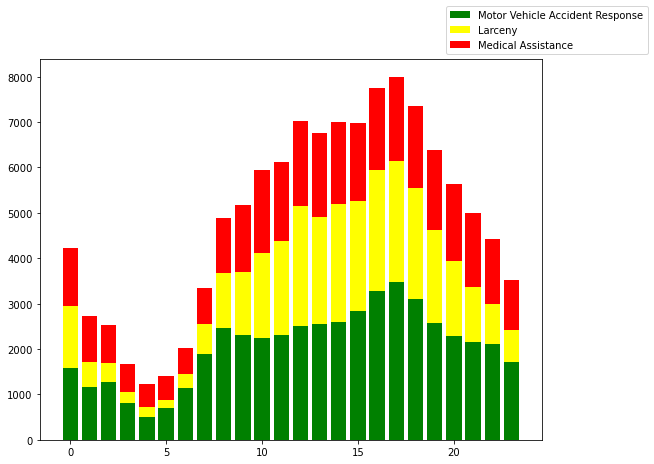

In [127]:
plt.figure(figsize=(9,7))
plt.bar(gp1['HOUR'],gp1['OFFENSE_CODE'],color="green",label="Motor Vehicle Accident Response")
plt.bar(gp2['HOUR'],gp2['OFFENSE_CODE'],color="yellow",bottom=gp1['OFFENSE_CODE'],label="Larceny")
plt.bar(gp3['HOUR'],gp3['OFFENSE_CODE'],color="red",bottom=add_df(gp1, gp2, 'HOUR')['OFFENSE_CODE'],label="Medical Assistance")

plt.legend(loc="lower left",bbox_to_anchor=(0.8,1.0))
plt.show()

ValueError: shape mismatch: objects cannot be broadcast to a single shape

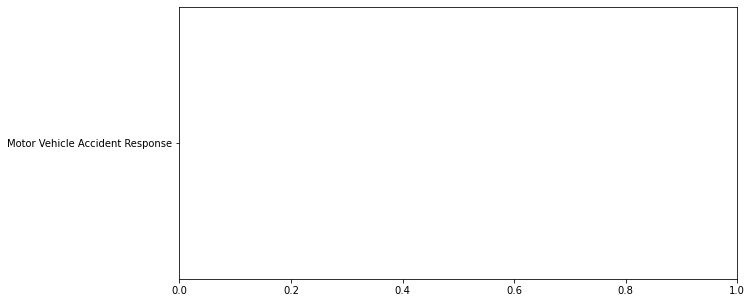

In [140]:
group = ['Motor Vehicle Accident Response','Larceny','Medical Assistance']
fig = plt.figure(figsize=(10, 5))
plt.barh(group, grouped_df['OFFENSE_CODE'], color='maroon')
plt.xlabel("Count")
plt.ylabel("OFFENSE_CODE_GROUP")
plt.title("Crime trend with years")
plt.show()

In [ ]:
# Density HeatMap

In [19]:
df.groupby(['OFFENSE_CODE_GROUP']).size().sort_values(ascending=False)

OFFENSE_CODE_GROUP
Motor Vehicle Accident Response              49603
Larceny                                      34750
Medical Assistance                           32741
Investigate Person                           24754
Other                                        24050
                                             ...  
Gambling                                         8
INVESTIGATE PERSON                               5
Burglary - No Property Taken                     5
HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE        4
Biological Threat                                3
Length: 67, dtype: int64

In [52]:
from folium import Map
from folium.plugins import HeatMap

df.dropna(subset=['Lat', 'Long'], inplace=True)

lat_min = 42.181845
lat_max = 42.39504158
long_min = -70.953726
long_max = -70.953726
lat_cen = 42.31547578198001
long_cen = -71.09574725298368

# hmap = Map(location=[42.3601, -71.0589],
hmap = Map(location=[lat_cen, long_cen],
           zoom_start=12,
           tiles='Stamen Toner',
           max_lat=lat_max,
           min_lat=lat_min,
           max_lon=long_max,
           min_lon=long_min,
           width=700,
           height=700)
hm_wide = HeatMap(
    list(zip(df.Lat.values, df.Long.values)),
    min_opacity=0.2,
    radius=17,
    blur=15,
    max_zoom=1,
)

In [53]:
hmap.add_child(hm_wide)

In [54]:
hmap2 = Map(location=[lat_cen, long_cen],
           zoom_start=12,
           tiles='Stamen Toner',
           max_lat=lat_max,
           min_lat=lat_min,
           max_lon=long_max,
           min_lon=long_min,
           width=700,
           height=700)
df_crime = df[df['OFFENSE_CODE_GROUP'] == 'Drug Violation']
hm_wide_crime = HeatMap(
    list(zip(df_crime.Lat.values, df_crime.Long.values)),
    min_opacity=0.2,
    radius=17,
    blur=15,
    max_zoom=1,
)
hmap2.add_child(hm_wide_crime)

In [21]:
# TODO
import fiona
from shapely.geometry import Point
import geoplot as gplt
import geopandas as gpd

AttributeError: partially initialized module 'fiona' has no attribute '_loading' (most likely due to a circular import)

In [13]:
crime_list = list(df.groupby(['OFFENSE_CODE_GROUP']).size().sort_values(ascending=False).index)[0:10]
crime_list.remove('Other')
crime_list

['Motor Vehicle Accident Response',
 'Larceny',
 'Medical Assistance',
 'Investigate Person',
 'Drug Violation',
 'Simple Assault',
 'Vandalism',
 'Verbal Disputes',
 'Investigate Property']

In [14]:
def create_gdf(t_df):
    gdf = t_df.copy()
    gdf['Coordinates'] = list(zip(gdf.Lat, gdf.Long))
    gdf.Coordinates = gdf.Coordinates.apply(Point)
    gdf = gpd.GeoDataFrame(
        gdf, geometry='Coordinates', crs={'init': 'epsg:4326'})
    return gdf

df_gdf = create_gdf(df)

bt_neighborhood = gpd.read_file('data/Boston_Neighborhoods.shp')
pd_districts = bt_neighborhood.to_crs({'init':'epsg:4326'})
bt_land = pd_districts.unary_union
bt_land = gpd.GeoDataFrame(gpd.GeoSeries(bt_land), crs={'init':'epsg:4326'})
bt_land = bt_land.rename(columns={0:'geometry'}).set_geometry('geometry')

fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(12,12))
for i , crime in crime_list:
    data = df_gdf.loc[df_gdf['OFFENSE_CODE_GROUP'] == crime]
    ax = fig.add_subplot(3, 3, i+1)
    gplt.kdeplot(data,
                 shade=True,
                 shade_lowest=False,
                 clip = bt_land.geometry,
                 cmap='Reds',
                 ax=ax)
    gplt.polyplot(bt_land, ax=ax)
    ax.set_title(crime)
plt.suptitle('Geographic Density of Different Crimes')
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

NameError: name 'gpd' is not defined